# Исследование рынка общественного питания Москвы

## Введение

Цель: исследовать данные о заведениях общественного питания Москвы для стартапа «Shut Up and Take My Money»

**План**

- *Выгрузка и и зучение данных*
- *Предобработка данных*
- *Анализ данных*
- *Детализированное исследование для открытия кофейни*
- *Презентация*


## Выгрузка и предобработка данных 

In [1]:
#импортирую библиотеки

import pandas as pd
import numpy as np
import matplotlib as mpl
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from plotly import graph_objects as go
from IPython.display import set_matplotlib_formats
import seaborn as sns
import matplotlib.pyplot as plt
import json



In [2]:
# чтобы таблички были красивыми: сниму ограничение на количество столбцов

pd.set_option('display.max_columns', None)

# сниму ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорирую предупреждения
pd.set_option('chained_assignment', None)

# выставлю ограничение на показ знаков после запятой
pd.options.display.float_format = '{:,.2f}'.format

In [3]:
#выгрузка датасета

data = pd.read_csv('/datasets/moscow_places.csv')


In [4]:
# посмотрю общую информацию

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data['name'].describe()

count     8406
unique    5614
top       Кафе
freq       189
Name: name, dtype: object

In [6]:
data['chain'].unique()

array([0, 1])

In [7]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

**Выводы**

В датасете хранится информация о 8406 заведениях в Москве.

Среди них разные завдения: кафе, рестораны, кофейни, пиццерии, бары и пабы, заведения быстрого питания, булочные, столовые.


Есть заведения, не имеющие посадочных мест вовсе (например, отделы кулинарии или предприятия быстрого обслуживания), а есть настоящие рекордсмены их 16 в виде залов, расчитанные на банкеты (более 1000-и посадочных мест).

На первый взгляд, данные не содержат пропусков, но кое-что требует правки: замена типа данных в столбце chain на булев (т.к. мы имеем бинарные значения в данном столбце). Так же нужно проверить данные на наличие дубликатов и вынести название улицы в отдельную колонку для дальнейшего изучения локаций.

Приступаем к предобработке данных.

### Предобработка данных

In [8]:
#проверю на явные дуликаты
data.duplicated().sum()


0

In [9]:
#приведу названия и адреса к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [10]:
#проверю на неявные дубликаты

data[data[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,0,188.00
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


In [11]:
#удалю неявные дубликаты

data = data.drop(index=[189,1430,2211,3091]).reset_index(drop=True)

In [12]:
#создам отдельный столбец с названием улиц
data['street'] = data.address.apply(lambda x: x.split(sep=', ')[1])

In [13]:
data
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица


In [14]:
#создам столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = np.where(data['hours'].str.contains('ежедневно') & data['hours'].str.contains('круглосуточно'), True, False)

In [15]:
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN,ижорская улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00,клязьминская улица,False
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00,клязьминская улица,False
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00,дмитровское шоссе,False
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,0,65.00,ангарская улица,False


Я провела предобработку данных в которой:
- проверила датасет на полные дубли
- привела названия и адреса к нижнему регистру
- нашла и удалила неявные дубликаты
- создала дополнительные столбцы для адреса и категории времени раблоты заведений



## Анализ данных

#### Исследование количества объектов общественного питания по категориям

In [16]:
#табличка количества объектов общественного питания по категориям

data_by_type = (
    data
    .groupby('category')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)

data_by_type['percent'] = data_by_type['count'] / sum(data_by_type['count']) * 100
data_by_type


,category,count,percent
3,кафе,2377,28.29
6,ресторан,2041,24.29
4,кофейня,1413,16.82
0,"бар,паб",765,9.10
5,пиццерия,633,7.53
2,быстрое питание,603,7.18
7,столовая,315,3.75
1,булочная,255,3.03


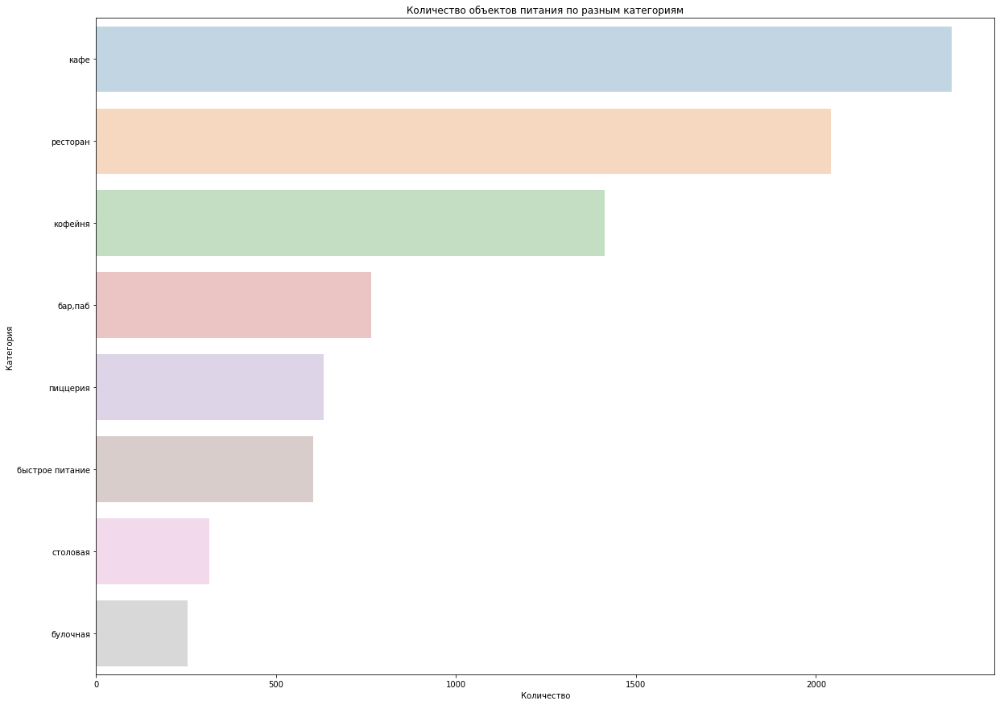

In [17]:
#строю график

plt.figure(figsize=(20, 15))
ax = sns.barplot(x='count', y='category', 
                 data=data_by_type, 
                 orient='h', alpha=0.3)
ax.set_title('Количество объектов питания по разным категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('Категория')
plt.show()

- Большая часть заведений - это кафе 2377 заведений или 28,3%.
- Рестораны (24%) и кофейни (16,8%) также входят в топ-3 заведений.
- Меньше всего 3% - булочных и столовых (3,75%)

#### Исследование количества посадочных мест в местах по категориям

In [18]:
#табличка количества посадочных мест в местах по категориям

chain_number = data.groupby('category').agg({'seats' : 'median',
                                'name' : 'count'}).reset_index()
chain_number.columns = ['category', 'median_seats', 'total_count']
chain_number['median_seats'] = chain_number['median_seats'].round()

chain_number.sort_values(by='total_count', ascending=False)

,category,median_seats,total_count
3,кафе,60.00,2377
6,ресторан,86.00,2041
4,кофейня,80.00,1413
0,"бар,паб",82.00,765
5,пиццерия,55.00,633
2,быстрое питание,65.00,603
7,столовая,76.00,315
1,булочная,50.00,255


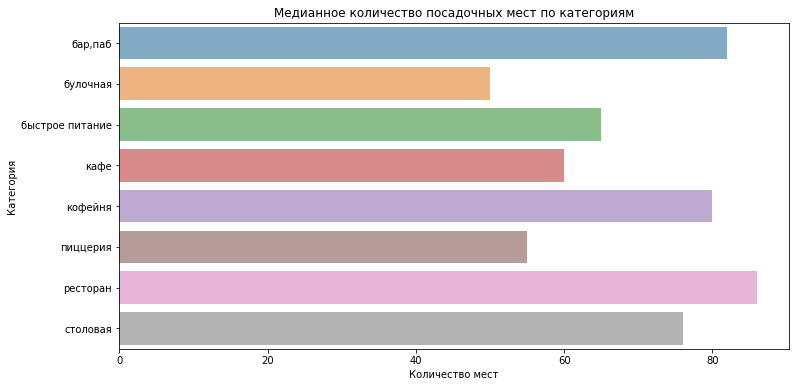

In [19]:
#строю график

plt.figure(figsize=(12, 6))
ax = sns.barplot(x='median_seats', y='category', data=chain_number, orient='h', alpha=0.6)
ax.set_title('Медианное количество посадочных мест по категориям')
ax.set_xlabel('Количество мест') 
ax.set_ylabel('Категория')
plt.show()

- Медианное количество мест в ресторанах составляет 86. 
- В кофейнях 80, в пабах/барах 82.
- В булочных 50



#### Cоотношение сетевых и несетевых заведений.

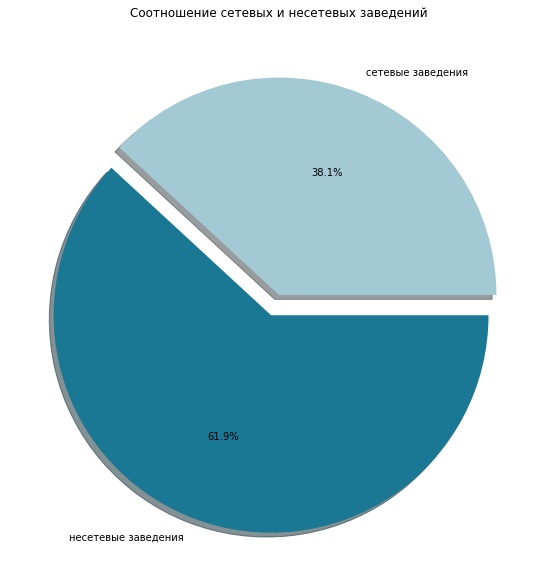

In [20]:
#график соотношения сетевых и несетвых заведений

ins_by_chain = data.groupby('chain').agg(count=('name','count')).reset_index()

plt.figure(figsize=(10, 10))
colors = ['#1b7895', '#a3c9d4']
explode = (0.1,0)
plt.pie(ins_by_chain['count'],
        labels=ins_by_chain['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), 
        colors=colors,
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

Несетевых заведений 61,9% , сетевых 38,1% => несетевых заведений больше на 23,8%

#### Cоотношение сетевые и несетевых заведений по категориям.

In [21]:
data_chain_type = data.groupby('category').agg({'chain' : 'sum',
                                'name' : 'count'}).reset_index()
data_chain_type.columns = ['object_type', 'chain_count', 'total_count']
data_chain_type['%%'] = data_chain_type['chain_count'] / data_chain_type['total_count'] * 100
data_chain_type = data_chain_type.sort_values('chain_count', ascending=False)
display(data_chain_type.sort_values(by='%%', ascending=False))


,object_type,chain_count,total_count,%%
1,булочная,156,255,61.18
5,пиццерия,330,633,52.13
4,кофейня,720,1413,50.96
2,быстрое питание,232,603,38.47
6,ресторан,730,2041,35.77
3,кафе,779,2377,32.77
7,столовая,88,315,27.94
0,"бар,паб",169,765,22.09


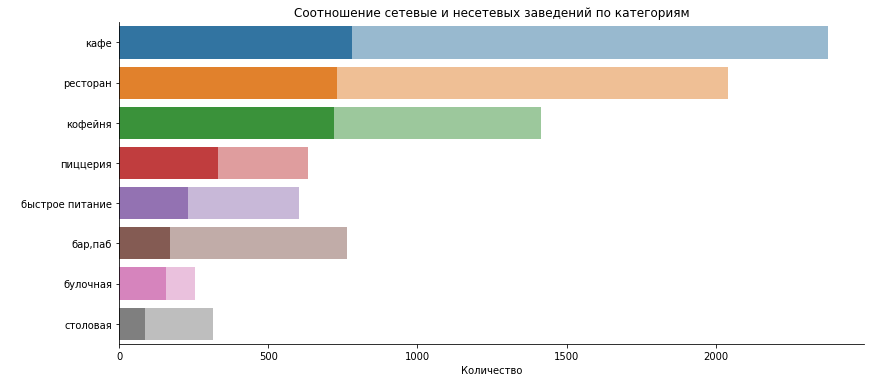

In [22]:
ax = sns.catplot(data=data_chain_type, 
                 kind="bar", 
                 x="chain_count", 
                 y="object_type",               
                 alpha=1, 
                 aspect=12/5)
ax1 = sns.barplot(x='total_count', y='object_type', data=data_chain_type, alpha=0.5,  orient='h')
ax.set_axis_labels('Количество', ' ')
plt.title('Cоотношение сетевые и несетевых заведений по категориям')
plt.show()

Чаще всего сетевыми являются заведения категории "булочная" - 61%, пиццерия - 52% и кофейни - 51%. 

Меньше всего сетевых баров 22% и столовых 28%


В абсолютном значении больше всего сетевых кафе(779), ресторанов(730) и кофеен(720).

#### Топ-15 популярных сетей по Москве

In [23]:
top_15 = data[data['chain'] == True]
top_15 = top_15.groupby('name').agg({'name': 'count', 'category':pd.Series.mode})
top_15 = top_15.rename(columns={'name':'count'})
top_15 = top_15.sort_values(by='count', ascending=False).reset_index().head(15)
top_15

,name,count,category
0,шоколадница,120,кофейня
1,домино'с пицца,76,пиццерия
2,додо пицца,74,пиццерия
3,one price coffee,71,кофейня
4,яндекс лавка,69,ресторан
5,cofix,65,кофейня
6,prime,50,ресторан
7,хинкальная,44,кафе
8,кофепорт,42,кофейня
9,кулинарная лавка братьев караваевых,39,кафе


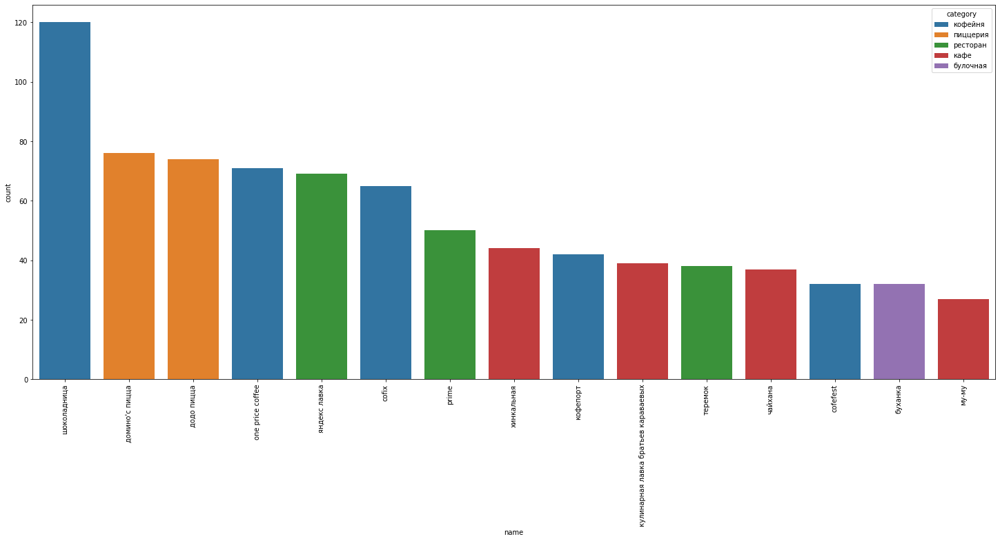

In [24]:
plt.figure(figsize = (25,10))
sns.barplot(x='name', y='count', data=top_15, hue='category', dodge=False)
plt.xticks (rotation=90)
plt.show()


Топ-15 довольно знакомых сетей (только Хинкальная как-то мне не знакома). Фактор, который их объединяет, нам ой взгляд -- доступность. Заведенеия этих сетей есть практически в каждом районе, в них доступные цены.

#### Общее количество заведений и количество заведений каждой категории по районам

In [25]:
#группирую данные
category_district =  (data.groupby(['district', 'category'], as_index=False).agg(count_object=('name', 'count')))

category_district['sum_object'] = category_district.groupby('district')['count_object'].transform(sum)
category_district['ratio'] = round(category_district['count_object'] / category_district['sum_object'], 3)
category_district.head(15)


,district,category,count_object,sum_object,ratio
0,Восточный административный округ,"бар,паб",53,798,0.07
1,Восточный административный округ,булочная,25,798,0.03
2,Восточный административный округ,быстрое питание,71,798,0.09
3,Восточный административный округ,кафе,272,798,0.34
4,Восточный административный округ,кофейня,105,798,0.13
5,Восточный административный округ,пиццерия,72,798,0.09
6,Восточный административный округ,ресторан,160,798,0.20
7,Восточный административный округ,столовая,40,798,0.05
8,Западный административный округ,"бар,паб",50,850,0.06
9,Западный административный округ,булочная,36,850,0.04


In [26]:
#строю график
fig = px.bar(category_district, 
             x='ratio', 
             y='district', 
             color='category', 
             title='Распределение заведений по категориям по округам', 
             text=round(category_district['ratio']*100,2))
fig.update_layout(
    yaxis_title='Район',
    xaxis_title='%',
    yaxis=dict(
        tickmode='array', 
        tickvals=category_district['district'], 
        ticktext=category_district['district']
    ),
    legend_title='Категория заведений ',
    autosize=False,
    width=1200,height=500
)

fig.show()




- в датасете присутствуют административные округа: ЮАО, ЮЗАО, ЮВАО, ЦАО, СЗАО, СВАО, САО, ЗАО, ВАО
- бОльшую долю по всем округам заведений занимают кафе и рестораны
- булочные и столовые по округам заняли меньшую долю графика

#### Распределение средних рейтингов по категориям заведений.

In [27]:
#посчитаю срдние рейтинги по категориям
rating_dat = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()
rating_dat.sort_values(by='rating', ascending=False)

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


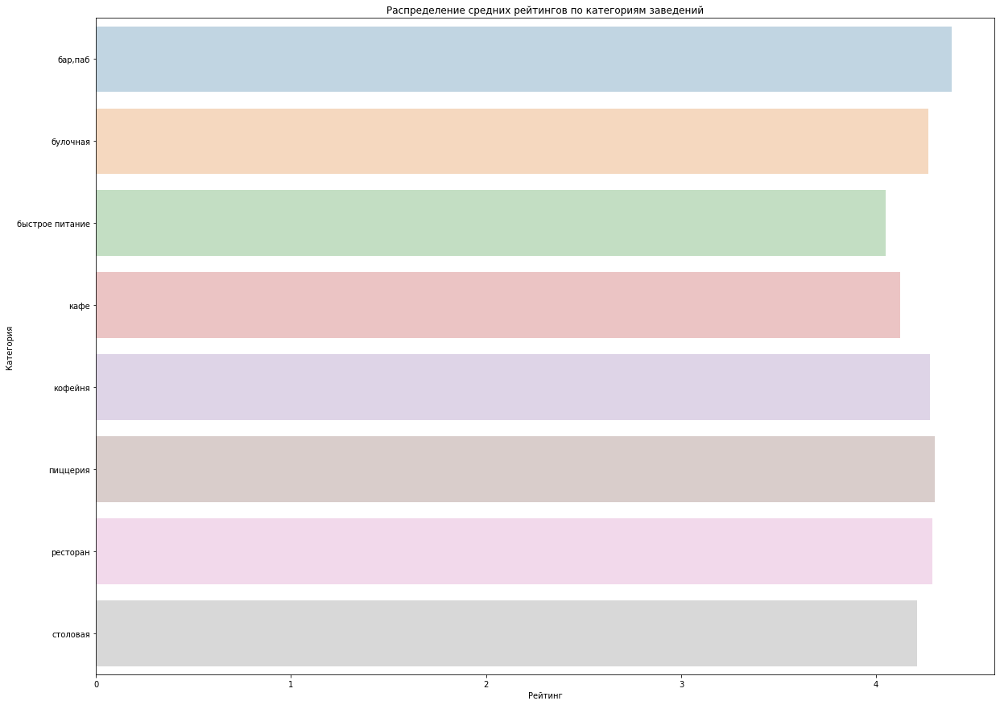

In [28]:
#построю график
plt.figure(figsize=(20, 15))
ax = sns.barplot(x='rating', y='category', 
                 data=rating_dat, 
                 orient='h', alpha=0.3)
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('Категория')
plt.show()

Усредненные рейтинги заведений по разным категориям отличаются не сильно: рейтинги распределились от 4,05 до 4,39

#### Средние рейтинги заведений по каждому району

In [29]:
#посчитаю рейтинги по округам

rating_df = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
rating_df.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [30]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- Самые высокие рейтинги у заведений в ЦАО. 
- Самые низкие рейтинги у заведений в ЮВАО.
- Рейтинги заведений в СЗАО и САО отличаются на 0,03
- Рейтинги заведений в ЮЗАО, ЗАО, ЮАО, ВАО, СВАО расположились на уровне от 4,15 до 4,19

#### Отображение всех заведений датасета на карте с помощью кластеров.

In [31]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
l = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(l)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
l

- По карте видно, что крупные кластеры заведений находятся в районе ТТК (1981 и 1387) в центральном округе.
- В ЮВАО есть кластер с 51 заведением (возле Развилки в районе Орехово-Борисова)
- При увеличении масштаба кластеры сокращаются, но их количество увеличивается

#### Найдите топ-15 улиц по количеству заведений. 

In [32]:
#создаю таблицу
top_streets = data[data['street'].isin(
    data.groupby('street')['name'].count()
    .sort_values(ascending=False).head(15).index)]

streets_and_cat = top_streets.groupby(['street','category'], as_index=False)['name'].count()
streets_and_cat.rename ({'name':'count'}, axis=1, inplace=True)

#строю график
fig = px.bar(streets_and_cat, x='street', y='count', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Распределение количества заведений и категорий по топ 15 улицам',
                  xaxis_title='Улица',
                  yaxis_title='Количество заведений',
                  autosize=False,
                  width=900,
                  height=550,
                  xaxis={'categoryorder': 'total descending'})
fig.show()

- По количеству заведений лидирует Проспект Мира, это может быть связано с тем, что на Проспекте Мира находится ВДНХ, также эта улица имеет проятженность около 9 км и проходит через несколько административных округов (свао и цао). 
- Большая часть заведений на Проспекте Мира - кафе. 
- Меньше всего заведений (из топ-15) на Пятницкой улице. Эта улица протяженностью около 2 км в Центральном округе. На которой расположились рестораны (они занимают бОльшую долю на графике)

#### Найдите улицы, на которых находится только один объект общепита

In [33]:
top_streets_single = data.groupby('street').agg({'name':'count'}).reset_index()
top_streets_single = top_streets_single.query('name == 1')
top_streets_single['street'].unique()

array(['1-й автозаводский проезд', '1-й балтийский переулок',
       '1-й варшавский проезд', '1-й вешняковский проезд',
       '1-й голутвинский переулок', '1-й грайвороновский проезд',
       '1-й дербеневский переулок', '1-й земельный переулок',
       '1-й капотнинский проезд', '1-й кирпичный переулок',
       '1-й колобовский переулок', '1-й котляковский переулок',
       '1-й курьяновский проезд', '1-й николощеповский переулок',
       '1-й новокузнецкий переулок', '1-й рижский переулок',
       '1-й самотёчный переулок', '1-й сетуньский проезд',
       '1-й спасоналивковский переулок', '1-й щипковский переулок',
       '1-я боевская улица', '1-я курьяновская улица',
       '1-я линия хорошёвского серебряного бора', '1-я парковая улица',
       '1-я стекольная улица', '1-я фрунзенская улица',
       '1-я ямская улица', '11-я парковая улица', '12-я парковая улица',
       '14-я парковая улица', '16-я парковая улица',
       '17-й проезд марьиной рощи', '2-й балтийский переулок',
 

In [34]:

streets_sinngle = top_streets_single.groupby(['street','name'], as_index=False)['name'].count()
streets_sinngle.rename ({'name':'count'}, axis=1, inplace=True)
streets_sinngle = streets_sinngle[streets_sinngle['count'] == 1]
streets_sinngle.nunique()


street    457
count       1
dtype: int64

In [35]:
#street_one = data.groupby(['street']).agg(count=('name', 'count')).reset_index().sort_values(by='count', ascending=True).query('count == 1')

# Посмотрим на дататасет с этимим заведениями
street_one_place = data.query('street in @streets_sinngle.street')
street_one_place.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.89,37.49,4.10,средние,Средний счёт:300–500 ₽,400.00,NaN,0,180.00,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.46,4.50,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False


In [36]:
pivot_1 = street_one_place.pivot_table(index=['category'], values=['name'], aggfunc='count').sort_values(by='name', ascending=False)

pivot_1


,name
category,
кафе,159
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


Из 457 улиц, где находится только 1 завденеие есть категории кафе(159), ресторанов(93) и кофеен(84) они в топе по категориям.

In [37]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
d = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(d)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
street_one_place.apply(create_clusters, axis=1)

# выводим карту
d

1294 улиц с одним заведением,на первый взгляд какие-то проезды, возможно короткие улицы

В общем что-то исправила, но кажется что все равно не то

хочу сгруппировать по улицам и оставить только те, где в countбудет 1. Как это сделать?
Я вообще застряла тут

#### Картограмма (хороплет) с медианными значениями среднего чека по округам

In [ ]:
avg_bill = (
data[data['middle_avg_bill']!= 0]
    .groupby ('district')
    .agg({'middle_avg_bill':'median'})
    .reset_index()
    .sort_values(by='middle_avg_bill', ascending=False)
)
avg_bill

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
k = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по округам',
).add_to(k)

# выводим карту
k

Средний чек от 450 рублей до 1 000 рублей.

Самые высокие средние чеки в ЦАО и ЗАО, самый низкий в ЮЗАО.

Округа ЦАО и ЗАО считаются более дорогими, полагаю, поэтому в них выше средние чеки.

#### Общий вывод.

**Категории завдений в датасете**
- Большая часть заведений - это кафе 2377 заведений или 28,3%.
- Рестораны (24%) и кофейни (16,8%) также входят в топ-3 заведений.
- Меньше всего 3% - булочных и столовых (3,75%)

**Количество посадочных мест в местах по категориям**
- Медианное количество мест в ресторанах составляет 86.
- В кофейнях 80, в пабах/барах 82.
- В булочных 50

**Cоотношение сетевых и несетевых заведений в датасете**
- Несетевых заведений 61,9% , сетевых 38,1% => несетевых заведений больше на 23,8%

**Какие категории заведений чаще являются сетевыми?**
- Чаще всего сетевыми являются заведения категории "булочная" - 61%, пиццерия - 52% и кофейни - 51%.
- Меньше всего сетевых баров 22% и столовых 28%
- В абсолютном значении больше всего сетевых кафе(779), ресторанов(730) и кофеен(720).

**топ-15 популярных сетей в Москве**
- Топ-15 довольно знакомых сетей (только Хинкальная как-то мне не знакома).

**Какие административные районы Москвы присутствуют в датасете?**
- в датасете присутствуют административные округа: ЮАО, ЮЗАО, ЮВАО, ЦАО, СЗАО, СВАО, САО, ЗАО, ВАО
- бОльшую долю по всем округам заведений занимают кафе и рестораны
- булочные и столовые по округам заняли меньшую долю графика

**распределение средних рейтингов по категориям заведений**
- Усредненные рейтинги заведений по разным категориям отличаются не сильно: рейтинги распределились от 4,05 до 4,39

**Выводы по картограмме (хороплет) со средним рейтингом заведений каждого района**
-Самые высокие рейтинги у заведений в ЦАО.
- Самые низкие рейтинги у заведений в ЮВАО.
- Рейтинги заведений в СЗАО и САО отличаются на 0,03
- Рейтинги заведений в ЮЗАО, ЗАО, ЮАО, ВАО, СВАО расположились на уровне от 4,15 до 4,19

**Выводы по кластерам **
- По карте видно, что крупные кластеры заведений находятся в районе ТТК (1981 и 1387) в центральном округе.
- В ЮВАО есть кластер с 51 заведением (возле Развилки в районе Орехово-Борисова)
- При увеличении масштаба кластеры сокращаются, но их количество увеличивается

**топ-15 улиц по количеству заведений**
- По количеству заведений лидирует Проспект Мира, это может быть связано с тем, что на Проспекте Мира находится ВДНХ, также эта улица имеет проятженность около 9 км и проходит через несколько административных округов (свао и цао).
-Большая часть заведений на Проспекте Мира - кафе.
-Меньше всего заведений (из топ-15) на Пятницкой улице. Эта улица протяженностью около 2 км в Центральном округе. На которой расположились рестораны (они занимают бОльшую долю на графике)

**улицы, на которых находится только один объект общепита**
 000 

**Выводы по картограмме по среднему чеку**
- Самые высокие средние чек в ЦАО и ЗАО, самый низкий в ЮЗАО.
- Округа ЦАО и ЗАО считаются более дорогими, полагаю, поэтому в них выше средние чеки.




## Детализированное исследование для открытия кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [ ]:
map_data_coffie = data.query ('category=="кофейня"')
map_data_coffie.head()

In [ ]:
print('Количество кофеен',map_data_coffie['name'].count())

In [ ]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
t = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(t)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
map_data_coffie.apply(create_clusters, axis=1)

# выводим карту
t

- В датасете 1413 кофеен.
- Кофейни расположены во всех округах Москвы
- Больше всего кофеен сконцентрировано в Центральном округе


#### Есть ли круглосуточные кофейни?

In [ ]:
print('Количество круглосуточных кофеен',len(map_data_coffie[map_data_coffie['is_24/7']=='True']))

In [ ]:
map_data_coffie_all_day=map_data_coffie[map_data_coffie['is_24/7'] == True]
map_data_coffie_all_day.head()

In [ ]:
print('Количество круглосуточных кофеен',map_data_coffie_all_day['name'].count())

In [ ]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
w = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(w)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
map_data_coffie_all_day.apply(create_clusters, axis=1)

# выводим карту
w

Больше всего круглосуточных кофеен сосредоточено в центральном округе

#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [ ]:
data_coffie_rait = map_data_coffie.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
data_coffie_rait.sort_values(by='rating', ascending=False)

In [ ]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
e = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffie_rait,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(e)

# выводим карту
e

- Кофейни имеют рейтинг от 4,2  до 4,3 
- Кофейни с самым высоким рейтингом (от 4,31 до 4,34) расположены в ЦАО и СЗАО
- Кофейни с самыми низкими рейтингами (от 4,2 до 4,22) расположились в ЗАо и СВАО

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [ ]:
map_data_coffie['middle_coffee_cup'].describe()

- Средняя стоимость чашки капучино составляет 175 рублей.
- Медианная стоимость 170 рублей.

Стоит ориентироваться на стоимость между 170 и 225 рублей за чашку капучино, так как при установлении цены стоит ориентироваться не только на цены конкуретнов, но и на затраты на чашку.

#### Вывод

- Для открытия кофейни рекомендуется приобретение франшизы сетевой кофейни в Северо-Западном административном округе. Улицы СЗАО не входят в топ-15 по количеству заведений. 
- Средний чек в кофейнях СЗАО на уровне среднего чека в Центральном округе.
- В СЗАО на данный момент располагается меньшее количество кофеен, чем в Центральном округе.


## Презентация

Презентация https://disk.yandex.ru/i/8Y6TeKpoDeLQVw